In [1]:
import numpy as np
import pandas as pd 

from glob import glob
import os

In [2]:
train_df = pd.concat([pd.read_csv(path) for path in glob('train/*/*.csv')])
train_df['img_path'] = glob('train/*/image/*')

In [3]:
train_df

,img_name,leaf_weight,img_path
0,CASE01_01.png,49.193,train\CASE01\image\CASE01_01.png
1,CASE01_02.png,59.764,train\CASE01\image\CASE01_02.png
2,CASE01_03.png,72.209,train\CASE01\image\CASE01_03.png
3,CASE01_04.png,85.737,train\CASE01\image\CASE01_04.png
4,CASE01_05.png,102.537,train\CASE01\image\CASE01_05.png
...,...,...,...
24,CASE74_25.png,211.497,train\CASE74\image\CASE74_25.png
25,CASE74_26.png,214.116,train\CASE74\image\CASE74_26.png
26,CASE74_27.png,214.293,train\CASE74\image\CASE74_27.png
0,CASE75_01.png,210.872,train\CASE75\image\CASE75_01.png


In [4]:
train_df['case'] = train_df['img_name'].str[4:6].astype(int)
train_df

,img_name,leaf_weight,img_path,case
0,CASE01_01.png,49.193,train\CASE01\image\CASE01_01.png,1
1,CASE01_02.png,59.764,train\CASE01\image\CASE01_02.png,1
2,CASE01_03.png,72.209,train\CASE01\image\CASE01_03.png,1
3,CASE01_04.png,85.737,train\CASE01\image\CASE01_04.png,1
4,CASE01_05.png,102.537,train\CASE01\image\CASE01_05.png,1
...,...,...,...,...
24,CASE74_25.png,211.497,train\CASE74\image\CASE74_25.png,74
25,CASE74_26.png,214.116,train\CASE74\image\CASE74_26.png,74
26,CASE74_27.png,214.293,train\CASE74\image\CASE74_27.png,74
0,CASE75_01.png,210.872,train\CASE75\image\CASE75_01.png,75


In [5]:
def shift_df(train_df) : 
    
    dfs = []
    for case in train_df['case'].unique() : 
        temp = train_df[train_df['case']==case].copy()
        temp['real_weight'] = temp['leaf_weight'].shift(1)
        dfs.append(temp)
        
    return pd.concat(dfs)

train_df_shifted = shift_df(train_df)
train_df_shifted = train_df_shifted.dropna()
train_df_shifted


,img_name,leaf_weight,img_path,case,real_weight
1,CASE01_02.png,59.764,train\CASE01\image\CASE01_02.png,1,49.193
2,CASE01_03.png,72.209,train\CASE01\image\CASE01_03.png,1,59.764
3,CASE01_04.png,85.737,train\CASE01\image\CASE01_04.png,1,72.209
4,CASE01_05.png,102.537,train\CASE01\image\CASE01_05.png,1,85.737
5,CASE01_06.png,123.359,train\CASE01\image\CASE01_06.png,1,102.537
...,...,...,...,...,...
23,CASE74_24.png,211.002,train\CASE74\image\CASE74_24.png,74,206.349
24,CASE74_25.png,211.497,train\CASE74\image\CASE74_25.png,74,211.002
25,CASE74_26.png,214.116,train\CASE74\image\CASE74_26.png,74,211.497
26,CASE74_27.png,214.293,train\CASE74\image\CASE74_27.png,74,214.116


In [6]:
from sklearn.preprocessing import StandardScaler

SCALER = StandardScaler()

train_df_shifted['real_weight'] = SCALER.fit_transform(train_df_shifted[['real_weight']])
train_df_shifted['real_weight'] = np.log1p(train_df_shifted['real_weight'])

In [7]:
train_df_shifted = train_df_shifted.reset_index(drop=True)


In [8]:
test_imgs = glob('test/image/*')
test_imgs

['test/image\\001.png',
 'test/image\\002.png',
 'test/image\\003.png',
 'test/image\\004.png',
 'test/image\\005.png',
 'test/image\\006.png',
 'test/image\\007.png',
 'test/image\\008.png',
 'test/image\\009.png',
 'test/image\\010.png',
 'test/image\\011.png',
 'test/image\\012.png',
 'test/image\\013.png',
 'test/image\\014.png',
 'test/image\\015.png',
 'test/image\\016.png',
 'test/image\\017.png',
 'test/image\\018.png',
 'test/image\\019.png',
 'test/image\\020.png',
 'test/image\\021.png',
 'test/image\\022.png',
 'test/image\\023.png',
 'test/image\\024.jpg',
 'test/image\\025.png',
 'test/image\\026.png',
 'test/image\\027.png',
 'test/image\\028.png',
 'test/image\\029.png',
 'test/image\\030.png',
 'test/image\\031.png',
 'test/image\\032.png',
 'test/image\\033.png',
 'test/image\\034.png',
 'test/image\\035.png',
 'test/image\\036.png',
 'test/image\\037.png',
 'test/image\\038.png',
 'test/image\\039.png',
 'test/image\\040.png',
 'test/image\\041.png',
 'test/image\\04

In [9]:
submission = pd.read_csv('sample_submission.csv')

In [10]:
import torch
import random 

def seed_everything(seed = 42) :
    
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    

def NMAE(true, pred) : 
    mae = np.mean(np.abs(true-pred))
    score = mae/np.mean(np.abs(true))
    return score



    

In [11]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

In [12]:
SEED = 42
seed_everything(SEED)

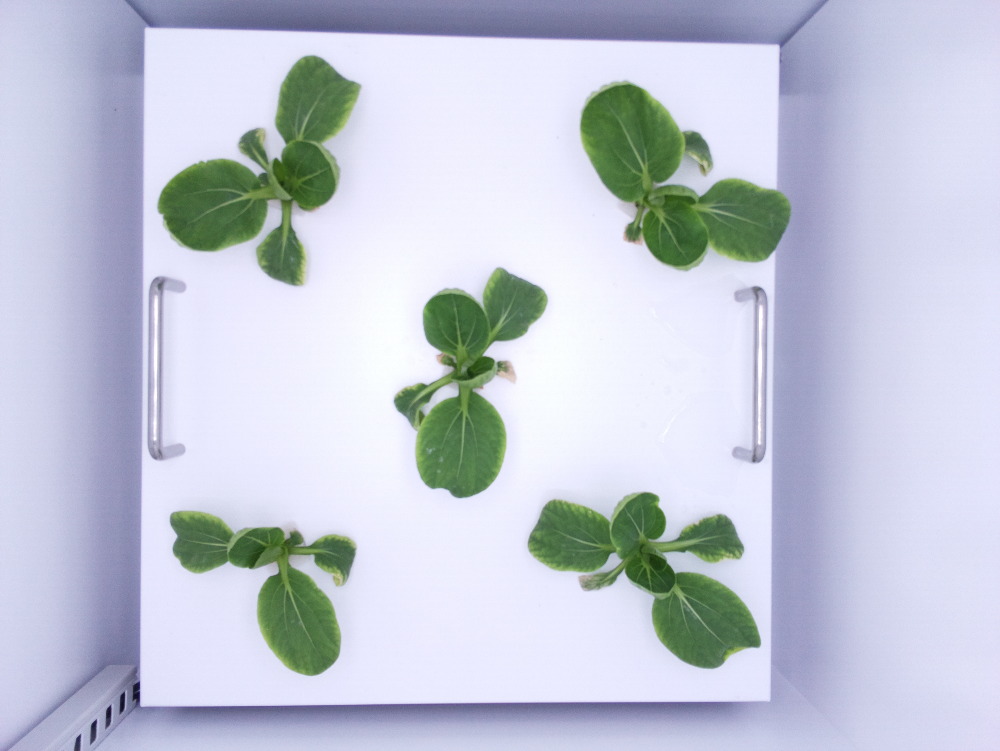

In [13]:
from PIL import Image

Image.open(train_df_shifted['img_path'][0])

In [14]:
np.array(Image.open(train_df_shifted['img_path'][0]))

array([[[174, 197, 228],
        [176, 197, 228],
        [184, 201, 231],
        ...,
        [217, 213, 238],
        [215, 211, 236],
        [214, 210, 237]],

       [[178, 197, 227],
        [179, 198, 228],
        [186, 201, 230],
        ...,
        [216, 212, 237],
        [214, 210, 235],
        [213, 209, 234]],

       [[187, 201, 230],
        [188, 202, 231],
        [190, 201, 231],
        ...,
        [214, 210, 235],
        [214, 210, 235],
        [214, 210, 235]],

       ...,

       [[153, 150, 195],
        [157, 151, 195],
        [158, 151, 195],
        ...,
        [222, 216, 242],
        [222, 216, 242],
        [222, 216, 242]],

       [[156, 153, 198],
        [156, 153, 196],
        [154, 148, 192],
        ...,
        [222, 216, 242],
        [221, 215, 241],
        [220, 214, 240]],

       [[153, 150, 195],
        [154, 151, 196],
        [153, 147, 193],
        ...,
        [221, 215, 241],
        [221, 215, 241],
        [221, 216, 239]]

In [15]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

from torch.utils.data import Dataset, DataLoader

In [16]:
class train_dataset(Dataset) : 
    def __init__(self, train_df, transform=None) :
        super(train_dataset).__init__()
        self.train_df = train_df 
        self.transform = transform
        
    def __len__(self) :
        return len(self.train_df)
    
    def __getitem__(self, idx) : 
        img = np.array(Image.open(self.train_df['img_path'][idx]))
        
        if self.transform : 
            img = self.transform(image=img)['image']
            
        weight = self.train_df['real_weight'][idx]
        weight = torch.tensor(weight, dtype=torch.float32)
            
        return img, weight

In [17]:
class test_dataset(Dataset) : 
    def __init__(self, test_imgs, transform=None) :
        super(test_dataset).__init__()
        self.test_imgs = test_imgs
        self.transform = transform
        
    def __len__(self) :
        return len(self.test_imgs)
    
    def __getitem__(self, idx) : 
        img = np.array(Image.open(self.test_imgs[idx]))
        
        if self.transform : 
            img = self.transform(image=img)['image']
            
        return img

In [18]:
import timm

from torch import nn, optim

In [19]:
class ConvNet(nn.Module) : 
    def __init__(self, model_name, pretrained=True, freeze_backbone =True) : 
        super(ConvNet, self).__init__()
        self.conv = timm.create_model(model_name, pretrained = pretrained)
        self.fc1 = nn.Linear(1000,256)
        self.fc2 = nn.Linear(256,1)
        self.relu = nn.ReLU()
        
    def forward(self, x) : 
        x = self.conv(x)
        x = self.fc1(x)
        x = self.relu(x)
        out = self.fc2(x)
        
        return out
        
        

In [20]:
IMAGE_SIZE = 128
TEST_SIZE = 0.2
N_EPOCH = 3
LR = 1e-3
BATCH_SIZE = 32
MODEL_NAME = 'densenet121'


In [21]:
from sklearn.model_selection import train_test_split

train_data, val_data = train_test_split(train_df_shifted, test_size=TEST_SIZE, random_state=SEED)
train_data = train_data.reset_index(drop=True)
val_data = val_data.reset_index(drop=True)


In [22]:
img_transform = A.Compose([
    A.Resize(IMAGE_SIZE, IMAGE_SIZE),
    A.Normalize(),
    ToTensorV2()
])

train_loader = DataLoader(train_dataset(train_data, transform =  img_transform), shuffle=True, batch_size=BATCH_SIZE)

val_loader = DataLoader(train_dataset(val_data, transform =  img_transform), shuffle=True, batch_size=BATCH_SIZE)

In [23]:
model = ConvNet(MODEL_NAME, pretrained=True).to(DEVICE)

In [24]:
criterion = nn.MSELoss().to(DEVICE)

In [25]:
optimizer = optim.Adam(model.parameters(), lr=LR)

In [26]:
# 학습되는 과정 보기 위해
from tqdm import tqdm 

for epoch in range(1) :  
    train_loss = 0 
    
    # 모델 선언
    model.train()
    
    #예측할땐 model.eval()
    
    for img, weight in tqdm(train_loader) : 
        img = img.to(DEVICE)
        weight = weight.to(DEVICE)
        
        optimizer.zero_grad()
        
        hypothesis = model(img)
        loss =criterion(weight, hypothesis)
        
        loss.backward()
        optimizer.step()
        
        train_loss += loss/len(train_loader)
        
    print(f'Train Loss = {train_loss}')

  0%|          | 0/38 [00:00<?, ?it/s]C:\ProgramData\Anaconda3\lib\site-packages\torch\nn\modules\loss.py:529: UserWarning: Using a target size (torch.Size([32, 1])) that is different to the input size (torch.Size([32])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
 97%|█████████▋| 37/38 [03:01<00:04,  4.84s/it]C:\ProgramData\Anaconda3\lib\site-packages\torch\nn\modules\loss.py:529: UserWarning: Using a target size (torch.Size([29, 1])) that is different to the input size (torch.Size([29])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
100%|██████████| 38/38 [03:05<00:00,  4.89s/it]

Train Loss = 0.9339338541030884


In [27]:
test_loader = DataLoader(test_dataset(test_imgs, transform=img_transform), shuffle=True, batch_size=BATCH_SIZE)

preds = []

model.eval() 
with torch.no_grad() : 
    for img in tqdm(test_loader) : 
        img = img.to(DEVICE)
        pred = model(img)
        pred = pred.cpu().numpy()
        preds.append(pred)
        
preds = np.concatenate(np.array(preds))

100%|██████████| 15/15 [01:12<00:00,  4.84s/it]
<ipython-input-27-bcf4d95a3691>:13: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  preds = np.concatenate(np.array(preds))


In [68]:
preds = SCALER.inverse_transform(np.expm1(preds))

In [69]:
submission['leaf_weight'] = preds 

In [71]:
submission.to_csv('submission_0609.csv', index=False)